# Experimento Rotas

O objetivo do presente experimento é importar e manipular os dados da semob de brasilia relacionados às paradas de ônibus e rotas dos ônibus.

## Input:

- Shape files : documento padrão de representar informações geolocalizados

- Dados de paradas e rotas dos ônibus do distrito federal

## Dependência

Uso das bibliotecas padrão de python (pandas, numpy), além de experimento para visualização e manipulação dessa estrutura




In [1]:
!pip install geopandas #Se não tiver instalado a depeendência

DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python3.9 -m pip install --upgrade pip


In [2]:
!pip install contextily

DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python3.9 -m pip install --upgrade pip


In [3]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx
from shapely.geometry import box, Point, Polygon, MultiPolygon
from shapely.wkt import loads

## Processando os pontos de ônibus

In [4]:
shapefile_path = 'data/paradas.shp'
gdf = gpd.read_file(shapefile_path)

In [5]:
Y = gdf['geometry'].apply(lambda point: point.y)
X = gdf['geometry'].apply(lambda point: point.x) 
array = list(zip(X, Y))

<AxesSubplot: >

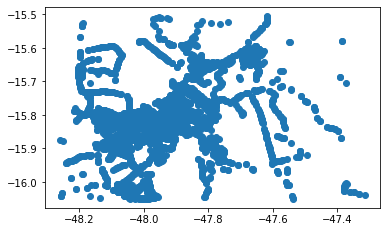

In [6]:
geo_df = gpd.GeoDataFrame(geometry=[Point(x,y) for x,y in array], crs="EPSG:31983").to_crs("EPSG:4326")
geo_df.plot()

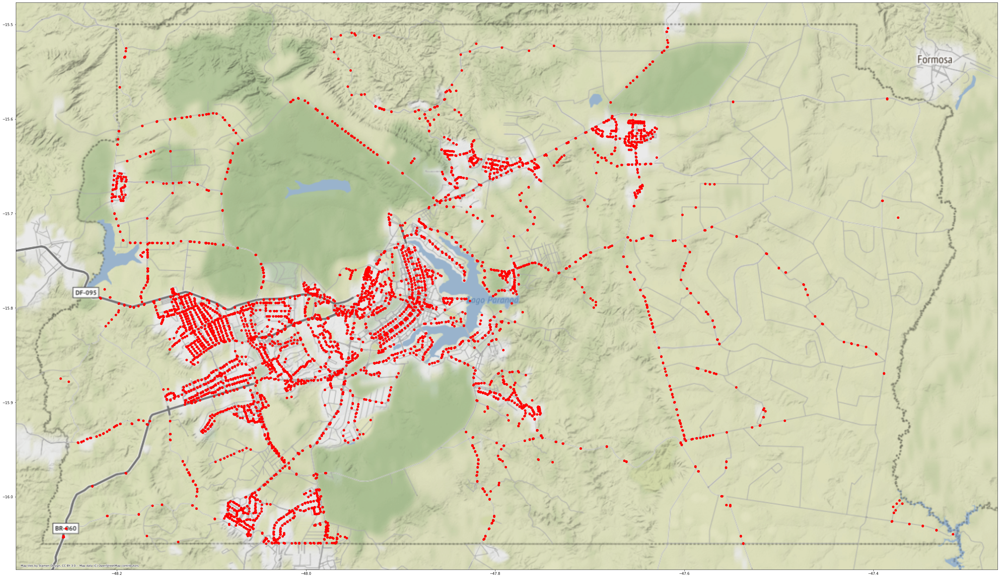

In [7]:
fig, ax = plt.subplots(1,1, figsize=(50,50))
ax = geo_df.plot(ax=ax, color="red")
#BASEMAP_SOURCE.plot()
cx.add_basemap(ax, crs=geo_df.crs.to_string())

## Processando as rotas de ônibus

<Derived Projected CRS: EPSG:31983>
Name: SIRGAS 2000 / UTM zone 23S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Brazil - between 48°W and 42°W, northern and southern hemispheres, onshore and offshore.
- bounds: (-48.0, -33.5, -42.0, 5.13)
Coordinate Operation:
- name: UTM zone 23S
- method: Transverse Mercator
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

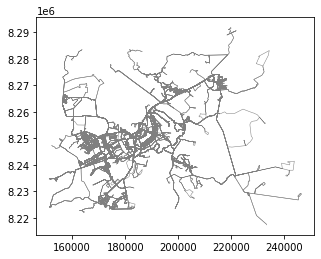

In [50]:
linhas = gpd.read_file('data/Linhas.shp')
linhas.plot(edgecolor='gray', linewidth=0.5)
linhas_df = gpd.GeoDataFrame(linhas, geometry='geometry')
linhas_x = gpd.GeoDataFrame(linhas, geometry='geometry', crs="EPSG:31983").to_crs("EPSG:4326")

linhas.head()
linhas.crs

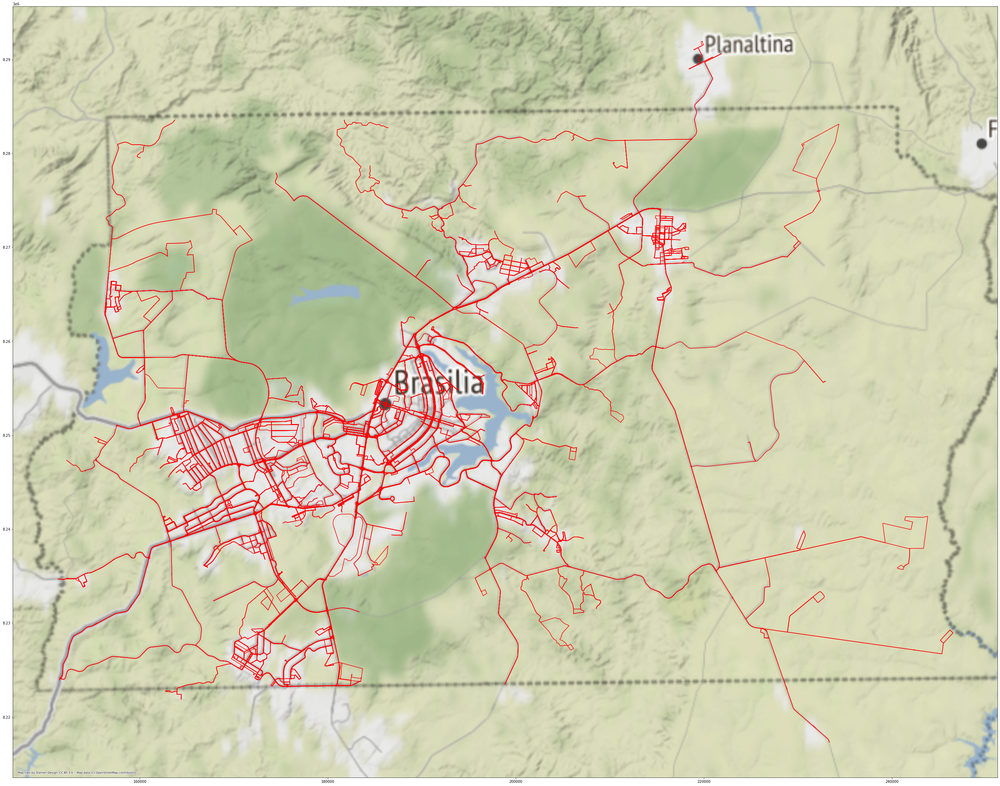

In [9]:
fig, ax = plt.subplots(1,1, figsize=(50,50))
ax = linhas_df.plot(ax=ax, color="red")
cx.add_basemap(ax, crs=linhas_df.crs.to_string())

In [13]:
!pip install geopy
!pip install networkx

DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python3.9 -m pip install --upgrade pip
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will n

In [14]:
from geopy.distance import geodesic
import networkx as nx

In [15]:
G = nx.Graph()

In [19]:
for point in linhas:
    G.add_node(point)

In [64]:
estruturas = linhas_x.loc[0,'geometry']
length = len(estruturas.coords)
print (length)

601


In [ ]:
tamanho_paradas = len(linhas_x)
for l in range(tamanho_paradas):
    estruturas = linhas_x.loc[l,'geometry']
    for i in range(len(estruturas.coords)):
        for j in range(i+1, len(estruturas.coords)):
            distance = geodesic(estruturas.coords[i], estruturas.coords[j]).km
            G.add_edge(estruturas.coords[i], estruturas.coords[j], weight=distance)

In [ ]:
start_point = (linhas_x.loc[5,'geometry'].coords[4])
end_point =  (linhas_x.loc[100,'geometry'].coords[4])
shortest_path = nx.shortest_path(G, start_point, end_point, weight='weight')